# Building Color Histogram Embedding and Image search

To build our histograms we will be relying primarily on the OpenCV and Numpy libraries.

OpenCV is a popular Computer Vision (CV) library, it's full of useful image load/save and manipulation functions.
NumPy is a very popular library focused on providing optimized numerical operations for multi-dimensional arrays.

Notebook Structure

1. Onboard dataset from HuggingFace datasets and perform baseline preprocessing

2. Method 1 : Building the color histogram from scratch

3. Method 2 : Building color histogram using predefined function (calcHist() from open-cv

4. Color Histogram Embedding and Search

In [1]:
!pip install opencv-python numpy datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 27.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 15.5 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


# 1. Onboard dataset from HuggingFace datasets and perform baseline preprocessing

In [2]:
from datasets import load_dataset

data = load_dataset('pinecone/image-set', split='train', revision='e7d39fc')
data

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/27.0 [00:00<?, ?B/s]

train.json:   0%|          | 0.00/63.7M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset({
    features: ['image_bytes', 'image'],
    num_rows: 21
})

Inside the image_bytes feature we have base64 encoded bytes representation of the images, we can decode them into Numpy arrays using the Open-CV library

In [3]:
from base64 import b64decode
import cv2
import numpy as np

def process_fn(sample):
    image_bytes = b64decode(sample['image_bytes'])
    image = cv2.imdecode(np.frombuffer(image_bytes, np.uint8), cv2.IMREAD_COLOR)
    return image

images = [process_fn(sample) for sample in data]

In [5]:
len(images)

21

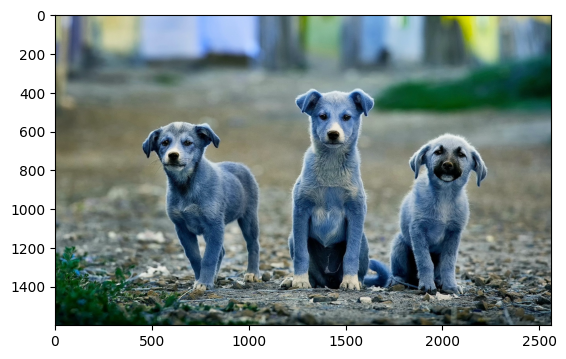

In [6]:
import matplotlib.pyplot as plt

plt.imshow(images[0])

OpenCV loads images in a Blue Green Red (BGR) format, Matplotlib expects RGB, so we invert to get the true color image

In [7]:
shape = images[0].shape
shape, images[0][0, 0, :]

((1600, 2560, 3), array([165, 174, 134], dtype=uint8))

In [8]:
import numpy as np

rgb_image = np.flip(images[0], 2)

shape = rgb_image.shape
shape, rgb_image[0, 0, :]

((1600, 2560, 3), array([134, 174, 165], dtype=uint8))

Note that while the shape of the array has remained the same, the three values have been reversed (those three values are the BGR -> RGB values for a single pixel in the images).

Now we can visualize in real color.

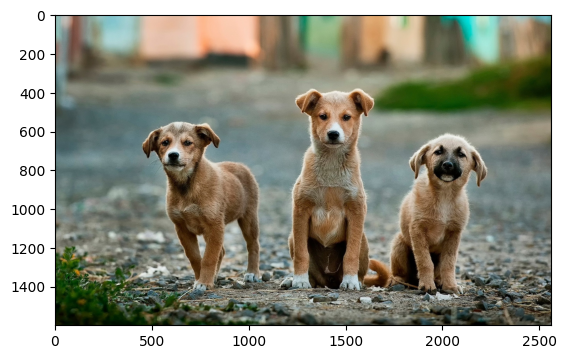

In [10]:
plt.imshow(rgb_image);

# 2. Method 1 : Building the color histogram from scratch

We'll start by building a color histogram the slow way so we can understand what is actually happening.

Let's take a look at image 0, pixel 0:

In [11]:
images[0][0, 0, :]

array([165, 174, 134], dtype=uint8)

Each pixel has a Blue, Green, and Red activation value on a scale from 0 (no color) to 255 (max color).

We can see this by plotting the following colors by simply modifying the RGB values (remember they are inverted from BGR to RGB between OpenCV and Matplotlib):

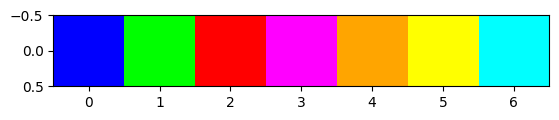

In [14]:
blue = [0, 0, 255]
green = [0, 255, 0]
red = [255, 0, 0]
violet = [255, 0, 255]
orange = [255, 165, 0]
yellow = [255, 255, 0]
cyan = [0, 255, 255]

colors = np.asarray([[blue, green, red, violet, orange, yellow, cyan]])

plt.imshow(colors)

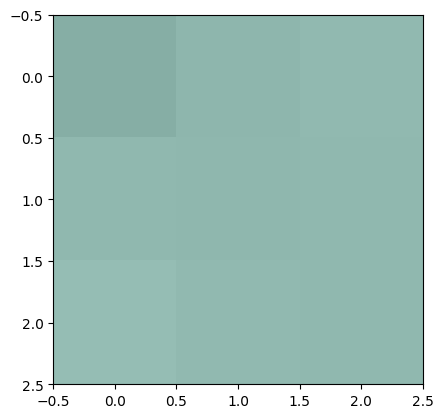

In [15]:
plt.imshow(rgb_image[:3, :3, :])

In [16]:
image_vector = rgb_image.reshape(1, -1, 3)
image_vector.shape

(1, 4096000, 3)

In [17]:
red = image_vector[0, :, 0]
green = image_vector[0, :, 1]
blue = image_vector[0, :, 2]

red.shape, green.shape, blue.shape

((4096000,), (4096000,), (4096000,))

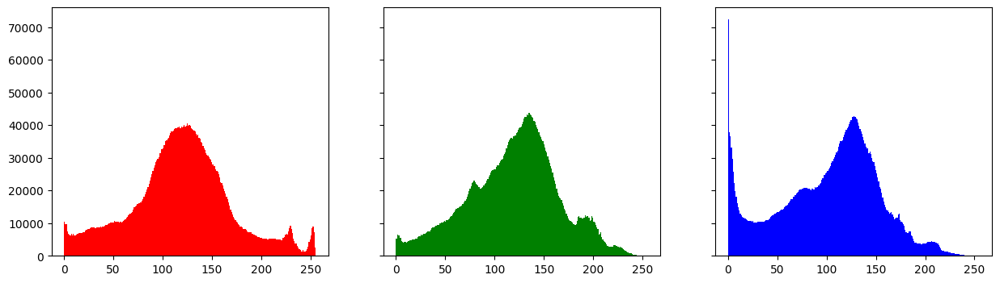

In [18]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4), sharey=True)
axs[0].hist(red, bins=256, color='r')
axs[1].hist(green, bins=256, color='g')
axs[2].hist(blue, bins=256, color='b')
plt.show()

In [19]:
def build_histogram(image, bins=256):
    # convert from BGR to RGB
    rgb_image = np.flip(image, 2)
    # show the image
    plt.imshow(rgb_image)
    # convert to a vector
    image_vector = rgb_image.reshape(1, -1, 3)
    # break into given number of bins
    div = 256 / bins
    bins_vector = (image_vector / div).astype(int)
    # get the red, green, and blue channels
    red = bins_vector[0, :, 0]
    green = bins_vector[0, :, 1]
    blue = bins_vector[0, :, 2]
    # build the histograms
    fig, axs = plt.subplots(1, 3, figsize=(15, 4), sharey=True)
    axs[0].hist(red, bins=bins, color='r')
    axs[1].hist(green, bins=bins, color='g')
    axs[2].hist(blue, bins=bins, color='b')
    plt.show()

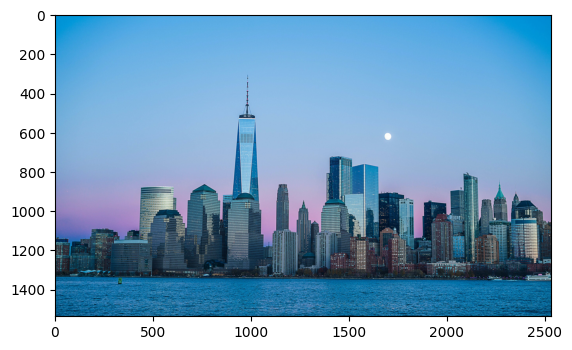

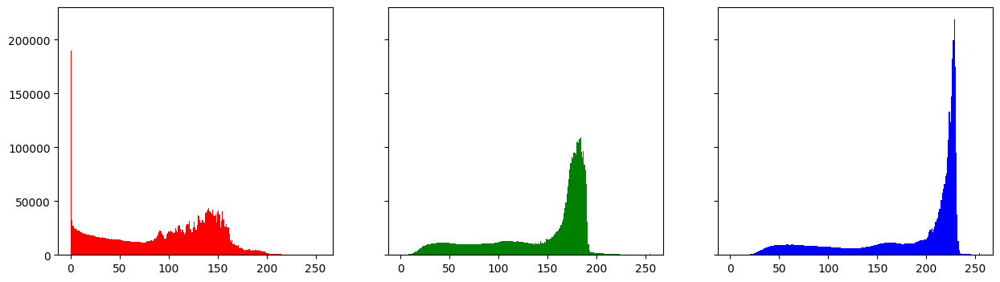

In [20]:
# we will see a lot of blue in this image, and it shows
# as high counts in high values in the blue histogram
build_histogram(images[1])

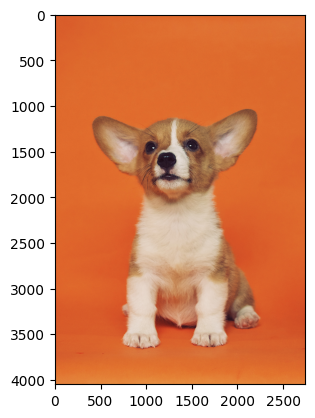

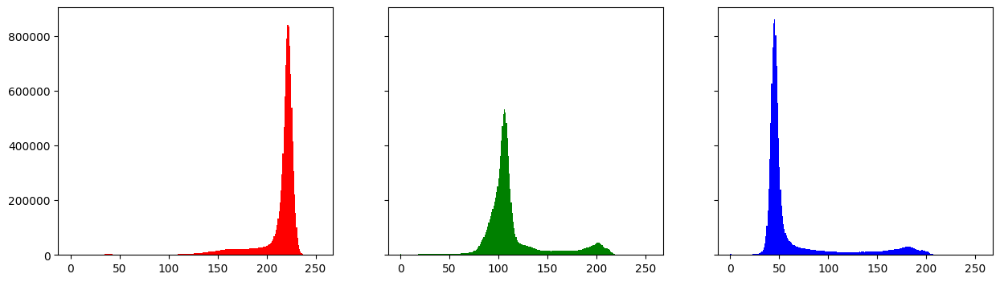

In [21]:
build_histogram(images[5])

One thing I added to this formula is the option to reduce the number of bins we are visualizing, eg rather than visualize every color value (0 -> 255) as a single bar, we can visualize values [0-4, 5-9, 10-14, ...] together using the bins parameter.

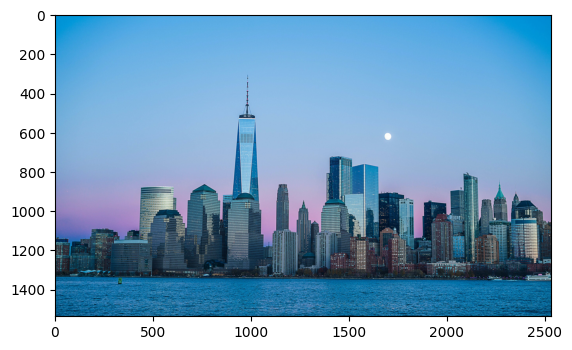

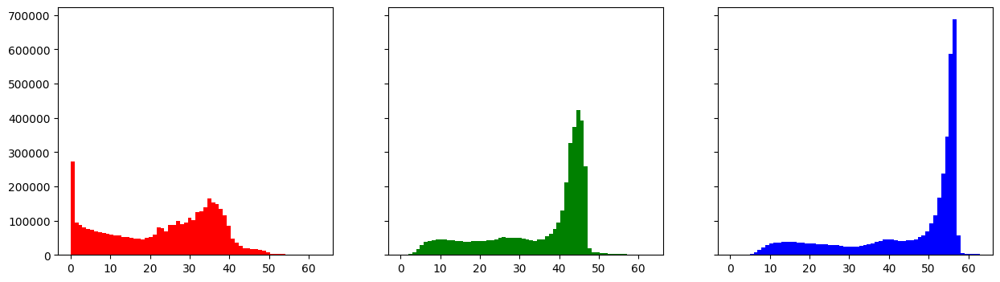

In [22]:
build_histogram(images[1], 64)

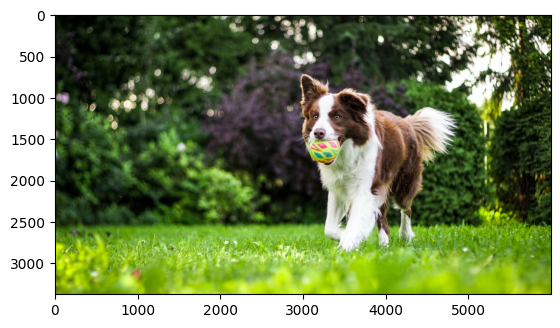

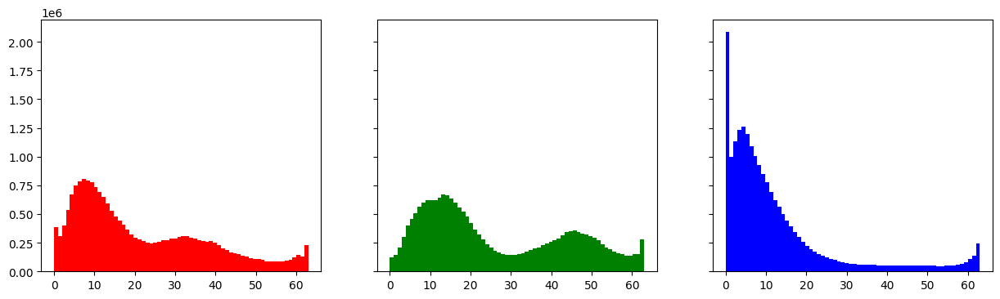

In [23]:
# very little blue in this image, and it shows as high counts in *low* values
# of the blue histogram
build_histogram(images[2], 64)

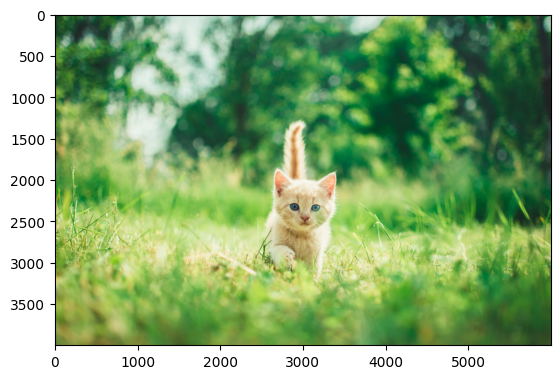

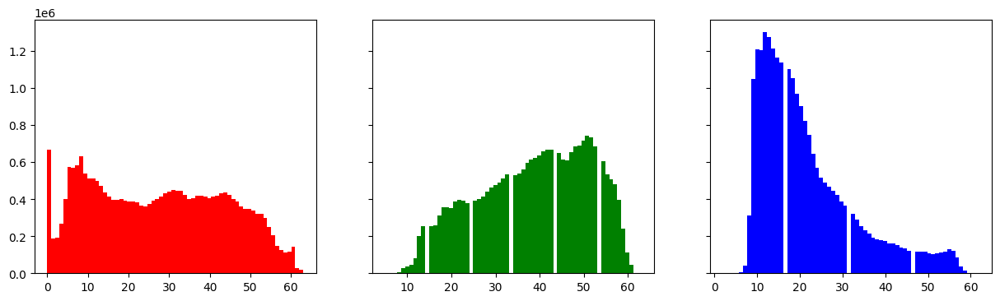

In [24]:
# blue again is very low, plenty of green
build_histogram(images[3], 64)

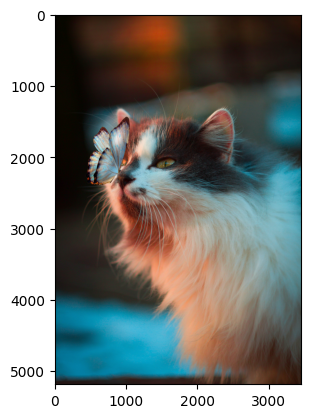

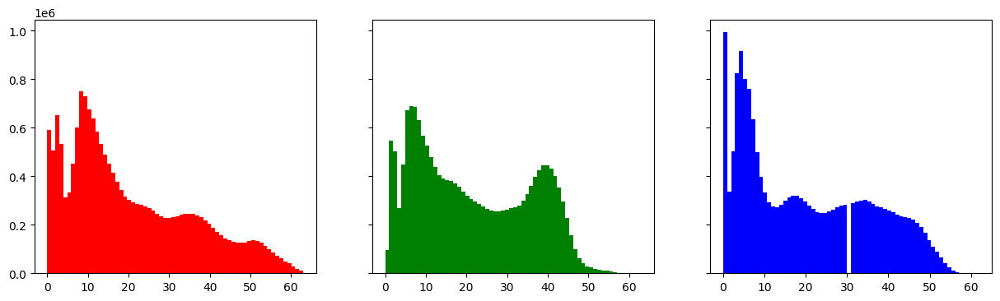

In [25]:
build_histogram(images[4], 64)

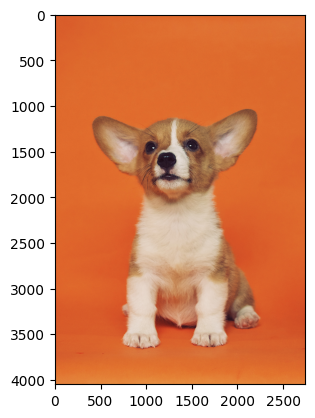

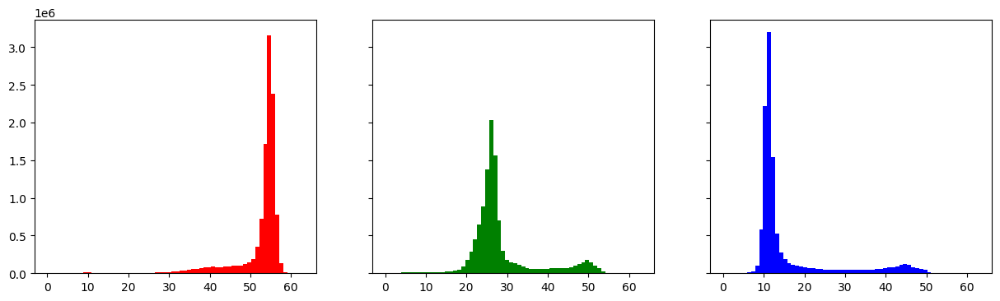

In [26]:
build_histogram(images[5], 64)

Okay so that is the slow way of building histograms, hopefully it's very clear how this works. But how can we do this more efficiently?

The open-cv library which we have already imported as cv2 actually has a function specifically built for calculating histograms called calcHist, it looks like this:

# 3. Method 2 : Building color histogram using predefined function (calcHist() from open-cv

In [27]:
red_hist = cv2.calcHist([images[5]], [2], None, [64], [0, 256])
green_hist = cv2.calcHist([images[5]], [1], None, [64], [0, 256])
blue_hist = cv2.calcHist([images[5]], [0], None, [64], [0, 256])

red_hist.shape

(64, 1)

In [28]:
help(cv2.calcHist)

Help on built-in function calcHist:

calcHist(...)
    calcHist(images, channels, mask, histSize, ranges[, hist[, accumulate]]) -> hist
    .   @overload
    .   
    .   this variant supports only uniform histograms.
    .   
    .   ranges argument is either empty vector or a flattened vector of histSize.size()*2 elements
    .   (histSize.size() element pairs). The first and second elements of each pair specify the lower and
    .   upper boundaries.



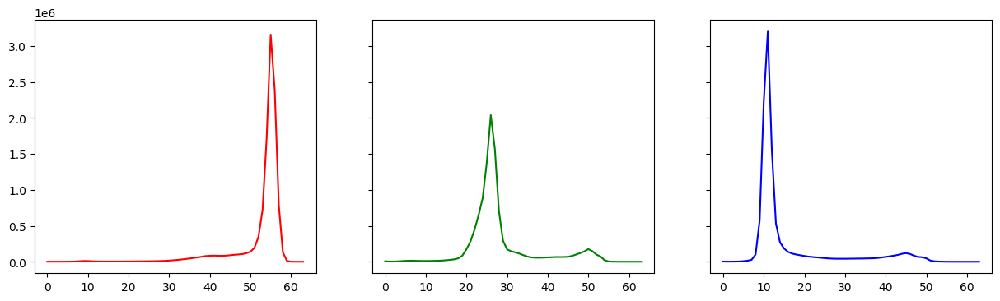

In [29]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4), sharey=True)
axs[0].plot(red_hist, color='r')
axs[1].plot(green_hist, color='g')
axs[2].plot(blue_hist, color='b')
plt.show()

# 4. Color Histogram Embedding and Search

First we load the images from HuggingFace Datasets.

In [30]:
from datasets import load_dataset
from base64 import b64decode
import cv2
import numpy as np

data = load_dataset('pinecone/image-set', split='train')

def process_fn(sample):
    image_bytes = b64decode(sample['image_bytes'])
    image = cv2.imdecode(np.frombuffer(image_bytes, np.uint8), cv2.IMREAD_COLOR)
    return image

images = [process_fn(sample) for sample in data]

We will create a function to build the RGB histograms and transform them into a single vector. The reason we use a vector is because we can compare vectors using metrics like Euclidean distance or cosine similarity.

In [31]:
def get_vector(image, bins=32):
    red = cv2.calcHist([image], [2], None, [bins], [0, 256])
    green = cv2.calcHist([image], [1], None, [bins], [0, 256])
    blue = cv2.calcHist([image], [0], None, [bins], [0, 256])
    vector = np.concatenate([red, green, blue], axis=0)
    vector = vector.reshape(-1)
    return vector

In [32]:
vec = get_vector(images[0])
vec.shape

(96,)

Now we have a single vector representation of our image color histograms, values [0, ..., 32] are red, [32, ..., 64] are green, and [64, ..., 96] are blue.

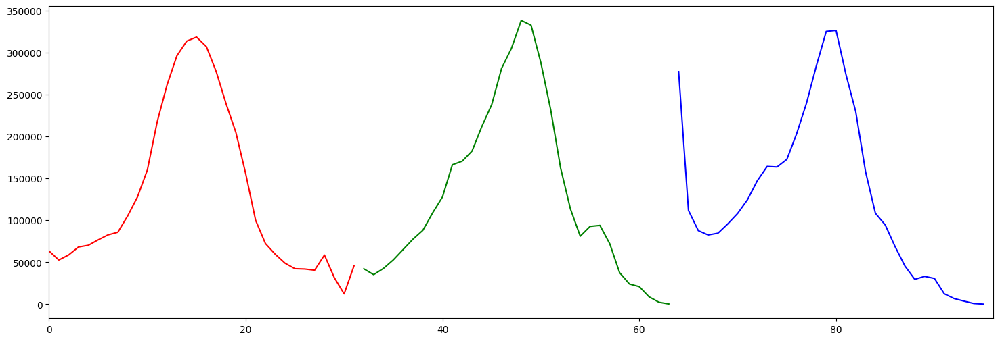

In [33]:
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 6))

plt.plot(list(range(32)), vec[:32], color='red')
plt.plot(list(range(32, 64)), vec[32:64], color='green')
plt.plot(list(range(64, 96)), vec[64:96], color='blue')

plt.xlim(0, 96)

plt.show()

Perform the same operation for all the images

In [34]:
image_vectors = []
for image in images:
    image_vectors.append(get_vector(image))

In [51]:
image_vectors[2].shape , image_vectors[10].shape , image_vectors[15].shape , image_vectors[20].shape

((96,), (96,), (96,), (96,))

Now we can compare vectors with Euclidean distance, calculated with Numpy

In [38]:
dist = np.linalg.norm(image_vectors[0] - image_vectors[1])
dist

2007400.0

Define the Utility function for both euclidean distance and cosine similarity

In [39]:
def euclidean(a, b):
    return np.linalg.norm(a - b)
def cosine(a, b):
    return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

Define the Utility function for top 5 searches based on input image

In [41]:
# during visualization we use this array of RGB images
rgb_images = np.array([np.flip(image, 2) for image in images], dtype=object)

def search(idx, top_k=5):
    query_vector = image_vectors[idx]
    distances = []
    for _, vector in enumerate(image_vectors):
        distances.append(cosine(query_vector, vector))
    # get top k most similar images
    top_idx = np.argpartition(distances, -top_k)[-top_k:]
    return top_idx

In [42]:
search(0)

array([ 3, 18, 14, 15,  0])

Define the utility function for visualization of images and color histograms for input query and search results

In [43]:
def visualize(query_i, results_i):
    query = rgb_images[query_i]
    span = int(len(image_vectors[0])/3)
    results = rgb_images[results_i]
    top_k = len(results)
    # visualize query image and it's color histogram
    fig, axs = plt.subplots(1, 2, figsize=(18, 10))
    axs[0].imshow(query)
    axs[0].axis('off')
    axs[1].plot(image_vectors[query_i][:span], 'r', label='red')
    axs[1].plot(image_vectors[query_i][span:span*2], 'g', label='green')
    axs[1].plot(image_vectors[query_i][span*2:], 'b', label='blue')
    plt.show()
    # visualize top k images and their color histograms
    fig0, axs0 = plt.subplots(1, top_k, figsize=(top_k*5, 5))
    fig1, axs1 = plt.subplots(1, top_k, figsize=(top_k*5, 5), sharey=True)
    for i in range(top_k):
        axs0[i].imshow(results[i])
        axs0[i].axis('off')
        axs1[i].plot(image_vectors[results_i[i]][:span], 'r', label='red')
        axs1[i].plot(image_vectors[results_i[i]][span:span*2], 'g', label='green')
        axs1[i].plot(image_vectors[results_i[i]][span*2:], 'b', label='blue')

Execute the search function

In [44]:
results_i = search(0)
results_i

array([ 3, 18, 14, 15,  0])

Execute the Visualize function

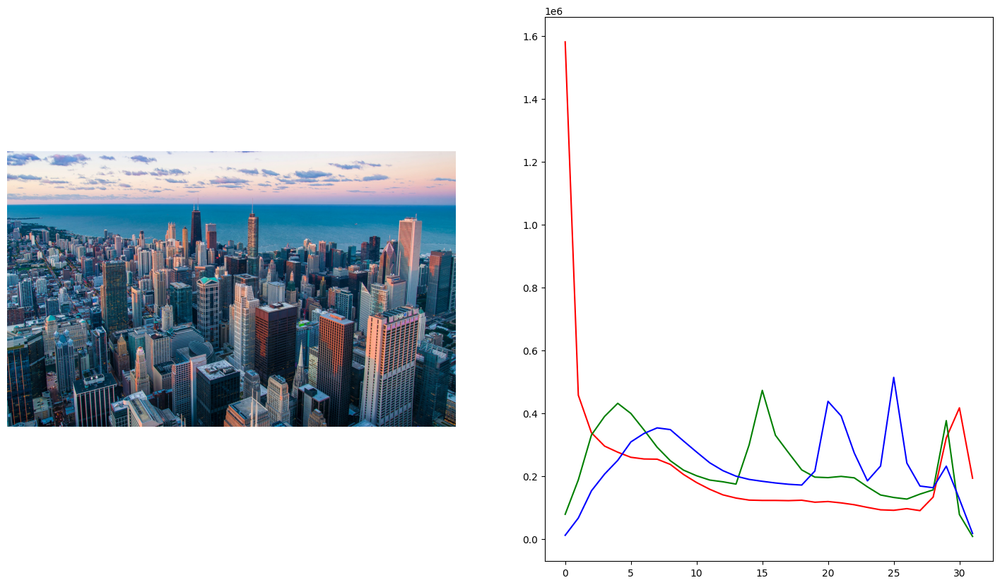

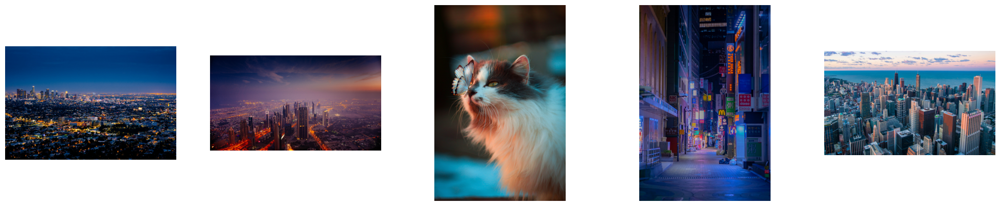

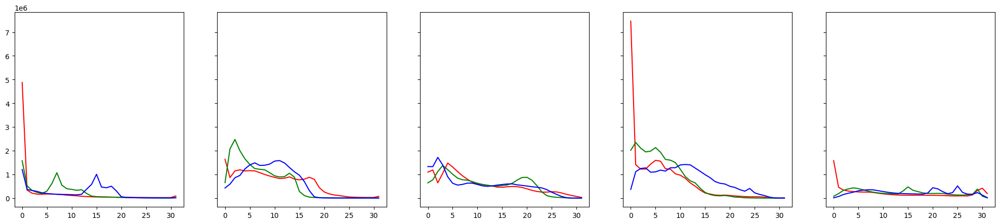

In [45]:
img=6
visualize(img, search(img))

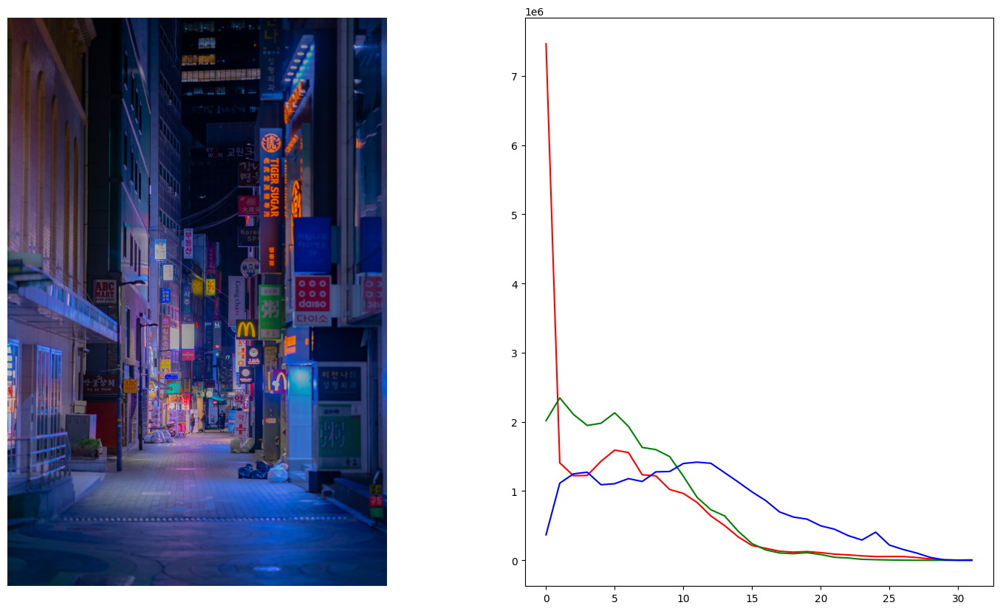

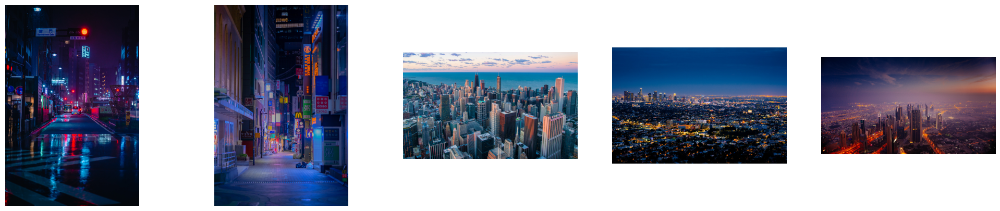

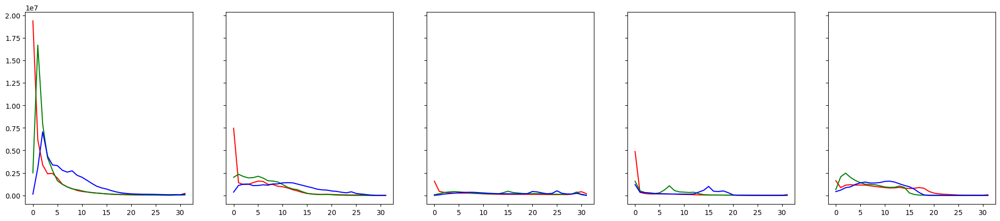

In [46]:
img = 7
visualize(img, search(img))

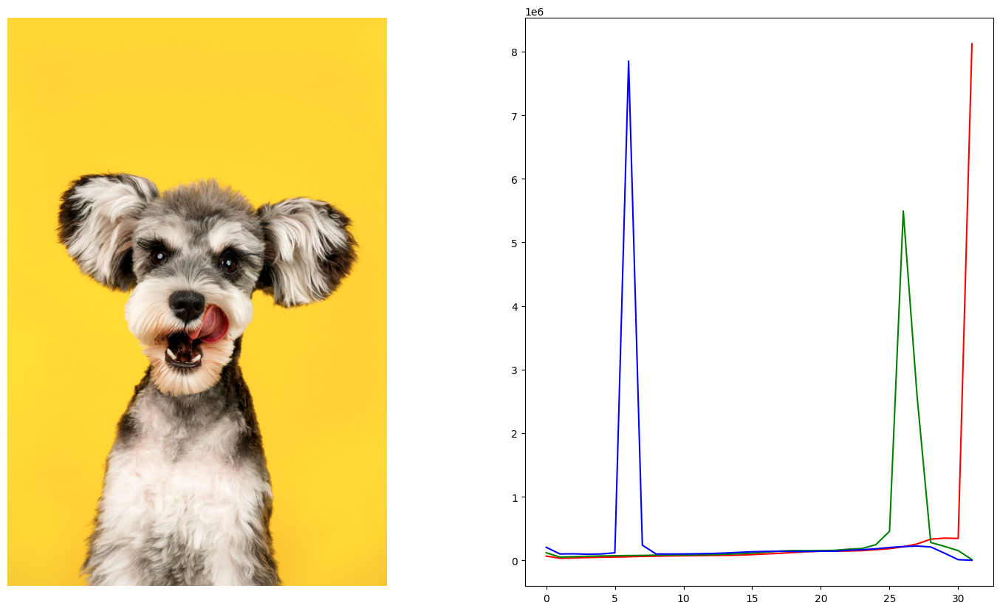

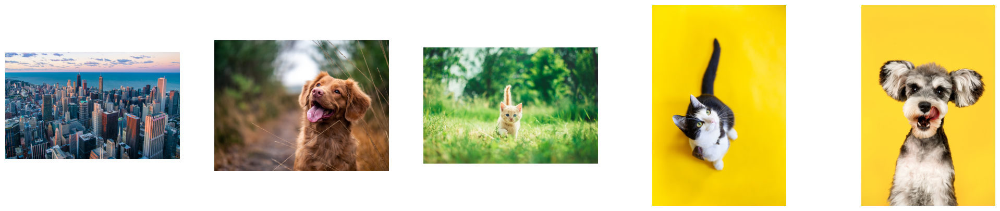

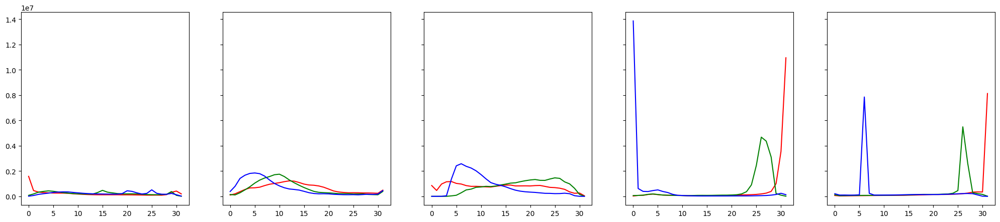

In [47]:
img = 10
visualize(img, search(img))

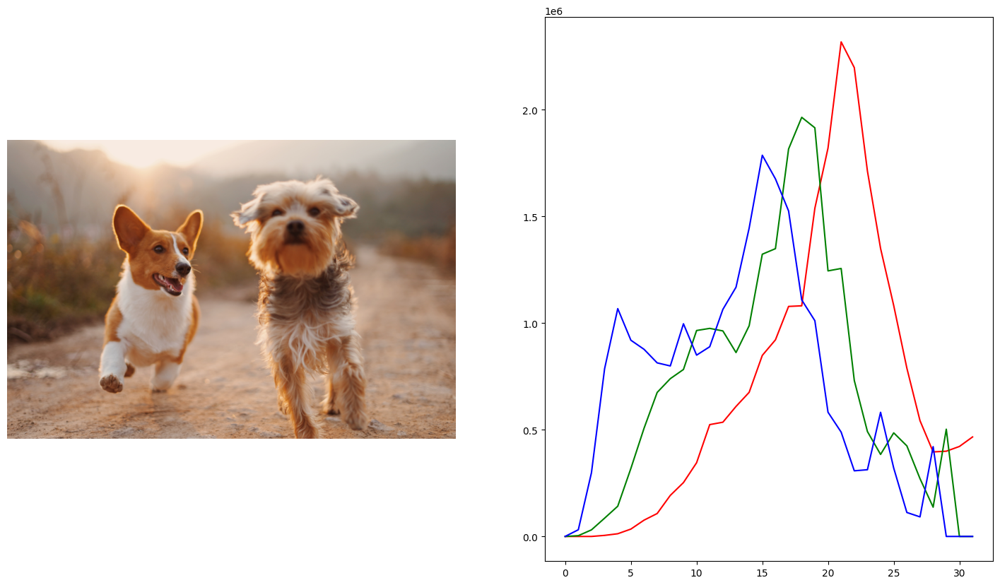

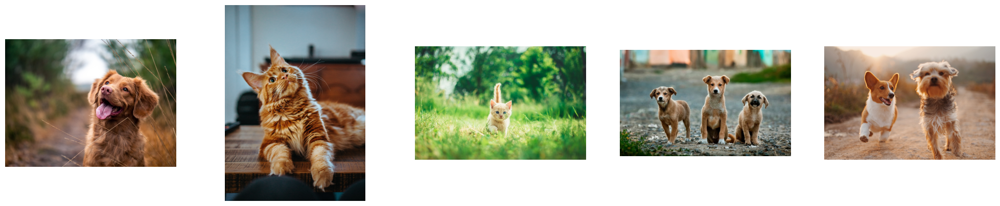

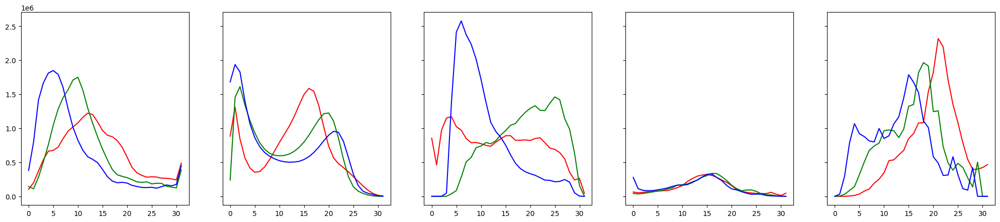

In [48]:
img = 15
visualize(img, search(img))

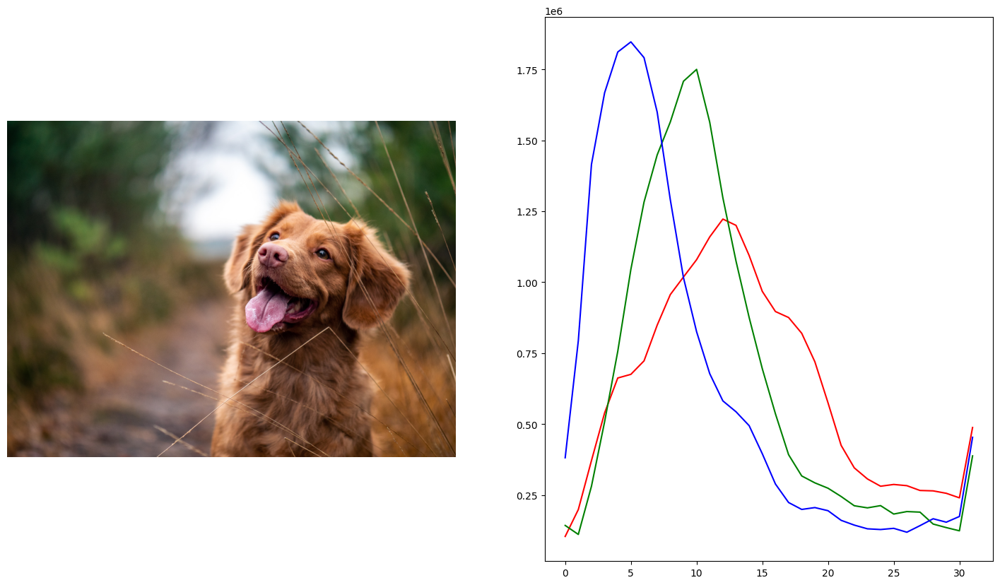

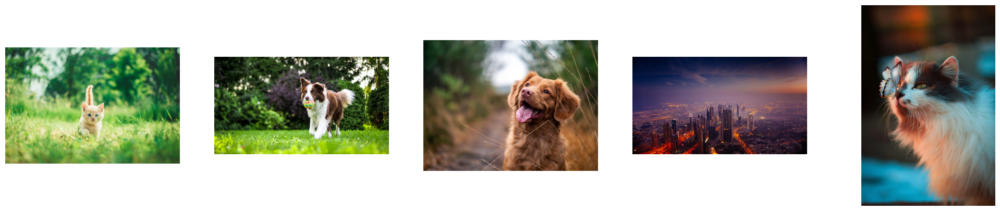

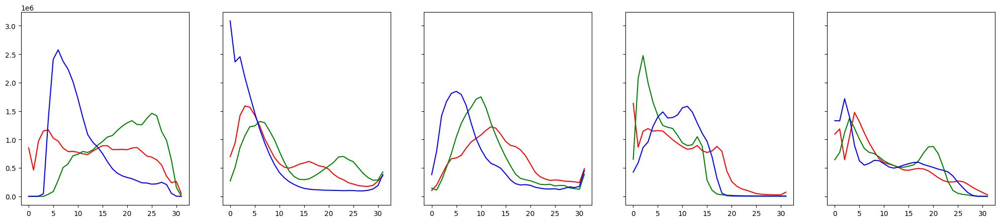

In [49]:
img = 18
visualize(img, search(img))